# Life Expectancy - World Health Organization

Data source: https://www.kaggle.com/kumarajarshi/life-expectancy-who

This dataset covers the years 2000 to 2015 and most of the world's countries. It contains the mean life expectancy for each country across the years and twenty measurable factors that are commonly found or expected to influence life expectancy.

For this project I decided to investigate which measurable factors have the most correlation with life expectancy with a focus on developed vs developing nations and how those factors may differ. I expect that adult, child and infant mortality rates will be correlated with life expectancy, along with vaccination variables. I also anticipate that development status of the countries will have a major impact on the life expectancy of their citizens.

I will use regression analysis in order to determine which independent variables in the dataset are the best predictors of the dependent variable life expectancy. Regression analysis is a reliable method of identifying which independent variables have the highest impact on a dependent variable.

The purpose of this project is for governments and NGOs to be able to make informed decisions regarding allocation of support and funding towards the aim of increasing life expectancy of citizens.

Conclusions are aimed at those working in world governments and NGOs.  
Code is aimed at programmers or analysts with basic Python skills at least.  

A note on the terminology of developed and developing countries. The World Health Organization and the World Bank have recently moved to using the terms low income, low middle income, high middle income and high income to categorize countries but since the dataset is based on the developed/developing categorization that was being used when the data was collected, I chose to leave it as is for the sake of simplicity and time. Regardless of the terms we choose to use, we cannot ignore the deep, long term effects of colonialism on a larger percent of the world. 

## Importing Python Libraries and Setting Up the Initial Dataframe from the csv File

In [1]:
import pandas as pd
import numpy as np
import statistics as st
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

df = pd.read_csv('Life Expectancy Data.csv')

df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## Data Cleaning

The data cleaning process was not linear. It actually involved a lot of back and forth between cleaning and EDA as I noticed odd outliers and data that didn't fit with the metadata.

### Metadata

Country   
Year - most range from 2000 - 2015   
Development Status - country is developed or developing   
Life expectancy - life expectancy age in years   
Adult Mortality - both sexes - probability of dying between 15 and 60 years per 1000 population  
Infant deaths - number of infant deaths per 1000 population  
Alcohol - consumption in litres of pure alcohol,  recorded per capita (15+)   
Health expenditure as percent of Gross Domestic Product per capita  
Hepatitis B - percent immunization coverage among 1-year-olds   
Measles - number of reported cases per 1000 population  
BMI - mean Body Mass Index of population  
Deaths under 5 years - number of under five deaths per 1000 population  
Polio - percent immunization coverage among 1-year-olds  
Government health expenditure as a percent of total government expenditure  
Diphtheria - Diphtheria, tetanus toxoid and pertussis (DTP3) - percent immunization coverage among 1-year-olds  
HIV/AIDS Deaths - under 5 years, per 1000 live births HIV/AIDS  
GDP - Gross Domestic Product per capita in USD  
Population - of the country  
Thinness 10-19 years- percent prevalence of thinness among children and adolescents for Age 10 to 19  
hinness 5-9 years = percent prevalence of thinness among children for Age 5 to 9  
Income composition of resources - Human Development Index between 0 and 1 based on income and availability of resources  
Schooling - number of years of schooling  

In [2]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [3]:
# renamed columns to be easier to use and more explanatory
df.columns = ['country', 'year', 'development_status', 'life_expectancy', 'adult_mortality', 'infant_deaths', 'alcohol_consumption', 'health_expenditure_pct_gdp', 'hep_b_immunization', 'measles_cases', 'bmi', 'deaths_under_5yrs', 'polio_immunization', 'govt_health_expenditure_pct_total', 'dpt_immunization', 'hiv_aids_deaths', 'gdp_per_capita', 'population', 'thiness_age_10-19', 'thiness_age_5-9', 'income_comp_resources', 'schooling_yrs']

### Data Overview

In [4]:
df.head()

,country,year,development_status,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,...,polio_immunization,govt_health_expenditure_pct_total,dpt_immunization,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [5]:
len(df)

2938

In [6]:
df.dtypes

country                               object
year                                   int64
development_status                    object
life_expectancy                      float64
adult_mortality                      float64
infant_deaths                          int64
alcohol_consumption                  float64
health_expenditure_pct_gdp           float64
hep_b_immunization                   float64
measles_cases                          int64
bmi                                  float64
deaths_under_5yrs                      int64
polio_immunization                   float64
govt_health_expenditure_pct_total    float64
dpt_immunization                     float64
hiv_aids_deaths                      float64
gdp_per_capita                       float64
population                           float64
thiness_age_10-19                    float64
thiness_age_5-9                      float64
income_comp_resources                float64
schooling_yrs                        float64
dtype: obj

In [7]:
df.isna().sum()

# NaNs for hep_b_immunization, gdp_per_capita and population are a significant portion of the data (approximately 20%)
# for regression analysis:
# I decided not to use population anyway, since it did not seem to be a relevant factor to life expectancy (domain knowledge)
# I decided not to use hep_b_immunization since it didn't seem to be correlated with life expectancy during exploratory analysis
# gdp_per_capita ended up being collinear with schooling during regression analysis so I kept schooling since the data seemed clean and it seemed to correlate well with life_expectancy
#  NaN values for several other variables were under 7% of the total values for that variable, and most were under 5%, so I decided to go ahead and work with them

country                                0
year                                   0
development_status                     0
life_expectancy                       10
adult_mortality                       10
infant_deaths                          0
alcohol_consumption                  194
health_expenditure_pct_gdp             0
hep_b_immunization                   553
measles_cases                          0
bmi                                   34
deaths_under_5yrs                      0
polio_immunization                    19
govt_health_expenditure_pct_total    226
dpt_immunization                      19
hiv_aids_deaths                        0
gdp_per_capita                       448
population                           652
thiness_age_10-19                     34
thiness_age_5-9                       34
income_comp_resources                167
schooling_yrs                        163
dtype: int64

In [8]:
print(652/2938)
print(194/2938)

# checking the percent NaNs for some variables

0.22191967324710687
0.06603131381892444


In [9]:
round(df.describe(),2)
#can spot some issues with the data here, for example maximum values that don't make sense based on the metadata and units

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,bmi,deaths_under_5yrs,polio_immunization,govt_health_expenditure_pct_total,dpt_immunization,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs
count,2938.00,2928.00,2928.00,2938.00,2744.00,2938.00,2385.00,2938.00,2904.00,2938.00,2919.00,2712.00,2919.00,2938.00,2490.00,2.286000e+03,2904.00,2904.00,2771.00,2775.00
mean,2007.52,69.22,164.80,30.30,4.60,738.25,80.94,2419.59,38.32,42.04,82.55,5.94,82.32,1.74,7483.16,1.275338e+07,4.84,4.87,0.63,11.99
std,4.61,9.52,124.29,117.93,4.05,1987.91,25.07,11467.27,20.04,160.45,23.43,2.50,23.72,5.08,14270.17,6.101210e+07,4.42,4.51,0.21,3.36
min,2000.00,36.30,1.00,0.00,0.01,0.00,1.00,0.00,1.00,0.00,3.00,0.37,2.00,0.10,1.68,3.400000e+01,0.10,0.10,0.00,0.00
25%,2004.00,63.10,74.00,0.00,0.88,4.69,77.00,0.00,19.30,0.00,78.00,4.26,78.00,0.10,463.94,1.957932e+05,1.60,1.50,0.49,10.10
50%,2008.00,72.10,144.00,3.00,3.76,64.91,92.00,17.00,43.50,4.00,93.00,5.76,93.00,0.10,1766.95,1.386542e+06,3.30,3.30,0.68,12.30
75%,2012.00,75.70,228.00,22.00,7.70,441.53,97.00,360.25,56.20,28.00,97.00,7.49,97.00,0.80,5910.81,7.420359e+06,7.20,7.20,0.78,14.30
max,2015.00,89.00,723.00,1800.00,17.87,19479.91,99.00,212183.00,87.30,2500.00,99.00,17.60,99.00,50.60,119172.74,1.293859e+09,27.70,28.60,0.95,20.70


In [10]:
df.corr().head(2)
# can see some possible correlation between life expectancy and other factors here

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,bmi,deaths_under_5yrs,polio_immunization,govt_health_expenditure_pct_total,dpt_immunization,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs
year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
life_expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975


Visual overview to look for patterns, oddities, outliers etc   
Ran sns.pairplot(df) and saved the image for easy reference   
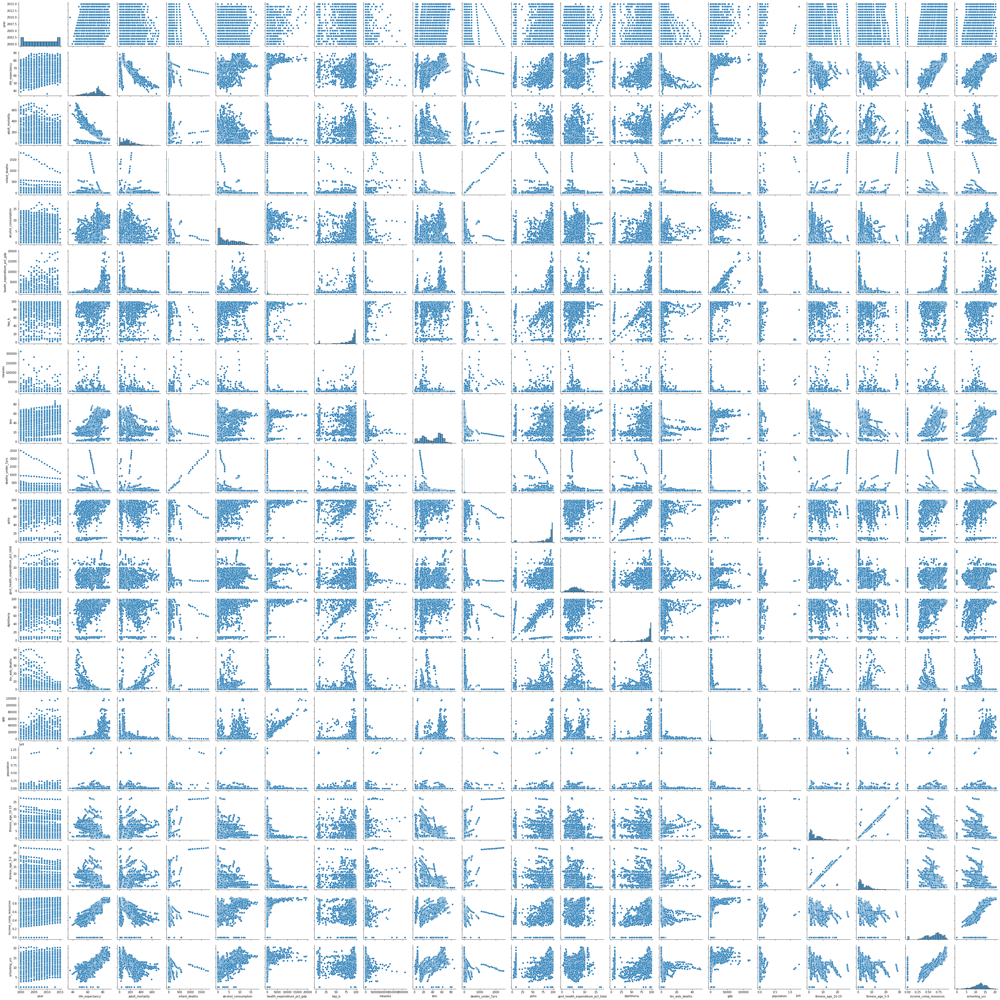

income_comp_resources - Human Development Index - aggr of life expectancy at birth, expected education, GNI per capita indices

### Corrected development status errors   
Five developed countries were mislabeled as developing (including Canada)

In [11]:
df['development_status'].unique()

array(['Developing', 'Developed'], dtype=object)

In [12]:
df['country'][df['development_status'] == 'Developed']

112                    Australia
113                    Australia
114                    Australia
115                    Australia
116                    Australia
                  ...           
2805    United States of America
2806    United States of America
2807    United States of America
2808    United States of America
2809    United States of America
Name: country, Length: 512, dtype: object

In [13]:
# used a simple numby where function to replace the 'Developed' with 'Developing' for each of the five countries
df['development_status'] = np.where(df.country == 'Canada', 'Developed', df.development_status)

In [14]:
df[df['country'] == 'Canada']

,country,year,development_status,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,...,polio_immunization,govt_health_expenditure_pct_total,dpt_immunization,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs
496,Canada,2015,Developed,82.2,64.0,2,NaN,0.000000,55.0,195,...,91.0,NaN,91.0,0.1,43315.74400,3584861.0,0.6,0.5,0.919,16.3
497,Canada,2014,Developed,82.0,65.0,2,8.1,102.190217,55.0,418,...,91.0,1.45,91.0,0.1,544.43376,35544564.0,0.5,0.5,0.912,15.9
498,Canada,2013,Developed,81.8,67.0,2,8.2,9733.228019,55.0,83,...,91.0,1.67,91.0,0.1,52413.72116,35155451.0,0.5,0.5,0.909,15.9
499,Canada,2012,Developed,81.6,68.0,2,8.3,9748.636237,7.0,10,...,99.0,1.78,95.0,0.1,52496.69487,3475545.0,0.5,0.5,0.907,15.9
500,Canada,2011,Developed,81.5,68.0,2,8.2,971.928038,7.0,803,...,87.0,1.82,87.0,0.1,5282.21760,3434278.0,0.5,0.5,0.903,15.9
501,Canada,2010,Developed,81.2,7.0,2,8.4,8649.674911,56.0,99,...,88.0,11.20,89.0,0.1,47447.47620,345274.0,0.5,0.4,0.898,15.9
502,Canada,2009,Developed,81.0,72.0,2,8.4,864.949930,42.0,14,...,89.0,11.17,91.0,0.1,4773.45436,33628571.0,0.5,0.4,0.898,15.9
503,Canada,2008,Developed,87.0,74.0,2,8.3,8433.936814,28.0,62,...,89.0,1.30,92.0,0.1,46596.33599,33245773.0,0.5,0.4,0.897,15.8
504,Canada,2007,Developed,85.0,74.0,2,8.3,7946.743581,14.0,101,...,9.0,9.83,94.0,0.1,44544.52680,32887928.0,0.5,0.4,0.894,15.8
505,Canada,2006,Developed,85.0,75.0,2,8.2,771.181769,14.0,13,...,95.0,9.75,95.0,0.1,4386.69948,325755.0,0.5,0.4,0.891,15.8


In [15]:
df['development_status'] = np.where(df.country == 'France', 'Developed', df.development_status)

In [16]:
df['development_status'] = np.where(df.country == 'Greece', 'Developed', df.development_status)

In [17]:
df['development_status'] = np.where(df.country == 'Finland', 'Developed', df.development_status)

In [18]:
df['development_status'] = np.where(df.country == 'Israel', 'Developed', df.development_status)

### Outliers/errors in numeric values

In [19]:
pd.value_counts(df['infant_deaths']>1000)

False    2925
True       13
Name: infant_deaths, dtype: int64

In [20]:
pd.value_counts(df['infant_deaths']>150)

False    2830
True      108
Name: infant_deaths, dtype: int64

In [21]:
print(108/(2830+108))
# if I convert these outliers/errors to NaN values, it won't have much of an impact since they are only 3.6% of the values

0.03675970047651463


In [22]:
# according to world bank data, the highest number of infant deaths per 1000 was 140 during the time period of this datat
# therefore it's safe to assume that any value above 150 here is highly likely to be an error and can be replaced with NaN

df['infant_deaths'] = np.where(df['infant_deaths']>150, np.nan, df['infant_deaths'])

In [23]:
pd.value_counts(df['infant_deaths']>150)

False    2938
Name: infant_deaths, dtype: int64

In [24]:
pd.value_counts(df['infant_deaths']).isna

<bound method Series.isna of 0.0      848
1.0      342
2.0      203
3.0      175
4.0       96
        ... 
106.0      1
119.0      1
79.0       1
99.0       1
140.0      1
Name: infant_deaths, Length: 125, dtype: int64>

In [25]:
pd.value_counts(df['deaths_under_5yrs']>230)

False    2841
True       97
Name: deaths_under_5yrs, dtype: int64

In [26]:
# according to world bank data, the highest number of deaths under age 5 per 1000 was 230 during the time period of this datat

df['deaths_under_5yrs'] = np.where(df['deaths_under_5yrs']>230, np.nan, df['deaths_under_5yrs'])

In [27]:
pd.value_counts(df['deaths_under_5yrs']>230)

False    2938
Name: deaths_under_5yrs, dtype: int64

In [28]:
# according to Wikipedia and World Population Review, the mean BMI value for every country is below 35
# this variable will not be included in the analysis since almost half of the values seem to be incorrect
# and due to time constraints and logistics of finding a correct set, I will not correct this

pd.value_counts(df['bmi']>35)

True     1632
False    1306
Name: bmi, dtype: int64

In [29]:
# according to Data World, no country's'health_expenditure_pct_gdp' was higher than 16 during the years covered in this data
pd.value_counts(df['health_expenditure_pct_gdp']>17)

True     1970
False     968
Name: health_expenditure_pct_gdp, dtype: int64

In [30]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

# values looked to be way off but could be by factors of 10^n

19479.91161
738.2512954533823


In [31]:
# used the numpy where function again in an attempt to correct these values
df['health_expenditure_pct_gdp'] = np.where(df['health_expenditure_pct_gdp']>90, df['health_expenditure_pct_gdp']/10, df['health_expenditure_pct_gdp'])

In [32]:
pd.value_counts(df['health_expenditure_pct_gdp']>90)

False    2492
True      446
Name: health_expenditure_pct_gdp, dtype: int64

In [33]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

1947.991161
83.48356509178728


In [34]:
df['health_expenditure_pct_gdp'] = np.where(df['health_expenditure_pct_gdp']>90, df['health_expenditure_pct_gdp']/10, df['health_expenditure_pct_gdp'])

In [35]:
pd.value_counts(df['health_expenditure_pct_gdp']>90)

False    2895
True       43
Name: health_expenditure_pct_gdp, dtype: int64

In [36]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

194.7991161
27.80892732772805


In [37]:
df['health_expenditure_pct_gdp'] = np.where(df['health_expenditure_pct_gdp']>90, df['health_expenditure_pct_gdp']/10, df['health_expenditure_pct_gdp'])

In [38]:
pd.value_counts(df['health_expenditure_pct_gdp']>20)

False    1525
True     1413
Name: health_expenditure_pct_gdp, dtype: int64

In [39]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

89.95805845
26.17809042412559


In [40]:
df['health_expenditure_pct_gdp'] = np.where(df['health_expenditure_pct_gdp']>20, df['health_expenditure_pct_gdp']/10, df['health_expenditure_pct_gdp'])

In [41]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

19.99341033
5.828760782200817


In [42]:
df['health_expenditure_pct_gdp'] = np.where(df['health_expenditure_pct_gdp']>16, df['health_expenditure_pct_gdp']/10, df['health_expenditure_pct_gdp'])

In [43]:
print(df['health_expenditure_pct_gdp'].max())
print(df['health_expenditure_pct_gdp'].mean())

15.99415192
4.7141795567117075


In [44]:
pd.value_counts(df['health_expenditure_pct_gdp']==0)

False    2327
True      611
Name: health_expenditure_pct_gdp, dtype: int64

In the end, this column seemed too complicated to correct, especially with the range of values and possible overlap. For example, something like 15 could be 15% or 1.5% according to the World Bank range, so I decided not to use this variable for the regression analysis.

### One hot encoding of development status  
Since I expected development status to to be an important factor in life expectancy, I wanted to convert it to a measurable independent variable to be used in regression analysis so I added one hot encoding. In the end, I wasn't sure if that was working as a good predicting variable so I decided that it would be best to create separate dataframes and analyze developed countries and developing countries separately (in a later section below.)

In [49]:
dev_status_encoded = pd.get_dummies(df['development_status'])
dev_status_encoded.head()
# pd.get_dummies is a function that converts categorical data into numerical data by assigning each string value to a new
# column and encoding the rows as 1 or 0 depending on whether that element is present or not for that row
# creates a new dataframe

,Developed,Developing
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


In [50]:
df = pd.concat([df, dev_status_encoded], axis = 1)
# adding the new dataframe to the original dataframe 

In [51]:
df.head()

,country,year,development_status,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
0,Afghanistan,2015,Developing,65.0,263.0,62.0,0.01,7.127962,65.0,1154,...,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,0.0,0,1
1,Afghanistan,2014,Developing,59.9,271.0,64.0,0.01,7.352358,62.0,492,...,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0.0,0,1
2,Afghanistan,2013,Developing,59.9,268.0,66.0,0.01,7.321924,64.0,430,...,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0.0,0,1
3,Afghanistan,2012,Developing,59.5,272.0,69.0,0.01,7.818422,67.0,2787,...,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,0.0,0,1
4,Afghanistan,2011,Developing,59.2,275.0,71.0,0.01,7.097109,68.0,3013,...,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,0.0,0,1


In [145]:
df.to_csv('who_life_expectancy_cleaned.csv', index=False)
# saved the cleaned data as a csv file for future access

## Exploratory Data Analysis

### Overall data checks   
The purpose of this section was to look for patterns in the data, and more specifically, possible correlation between the dependent and independent variables in order to choose good ones to use for regression analysis.

In [146]:
round(df.describe(),2)
# confirming the data now makes sense

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
count,2938.00,2928.00,2928.00,2830.00,2744.00,2938.00,2385.00,2938.00,2841.00,2919.00,...,2938.00,2490.00,2.286000e+03,2904.00,2904.00,2771.00,2775.00,2938.0,2938.0,2938.0
mean,2007.52,69.22,164.80,13.75,4.60,4.71,80.94,2419.59,20.21,82.55,...,1.74,7483.16,1.275338e+07,4.84,4.87,0.63,11.99,0.2,0.2,0.8
std,4.61,9.52,124.29,22.99,4.05,4.12,25.07,11467.27,35.49,23.43,...,5.08,14270.17,6.101210e+07,4.42,4.51,0.21,3.36,0.4,0.4,0.4
min,2000.00,36.30,1.00,0.00,0.01,0.00,1.00,0.00,0.00,3.00,...,0.10,1.68,3.400000e+01,0.10,0.10,0.00,0.00,0.0,0.0,0.0
25%,2004.00,63.10,74.00,0.00,0.88,1.78,77.00,0.00,0.00,78.00,...,0.10,463.94,1.957932e+05,1.60,1.50,0.49,10.10,0.0,0.0,1.0
50%,2008.00,72.10,144.00,3.00,3.76,3.79,92.00,17.00,3.00,93.00,...,0.10,1766.95,1.386542e+06,3.30,3.30,0.68,12.30,0.0,0.0,1.0
75%,2012.00,75.70,228.00,17.00,7.70,7.12,97.00,360.25,23.00,97.00,...,0.80,5910.81,7.420359e+06,7.20,7.20,0.78,14.30,0.0,0.0,1.0
max,2015.00,89.00,723.00,150.00,17.87,15.99,99.00,212183.00,229.00,99.00,...,50.60,119172.74,1.293859e+09,27.70,28.60,0.95,20.70,1.0,1.0,1.0


In [147]:
df.corr().head(2)
# looking for possible predicting independent variables for the dependent variable life_expectancy

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
year,1.000000,0.170033,-0.079052,-0.034742,-0.052990,-0.082682,0.104333,-0.082493,-0.048595,0.094158,...,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400,-0.002039,-0.002039,0.002039
life_expectancy,0.170033,1.000000,-0.696359,-0.515279,0.404877,0.048532,0.256762,-0.157586,-0.531316,0.465556,...,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975,0.543168,0.543168,-0.543168


<AxesSubplot:xlabel='year'>

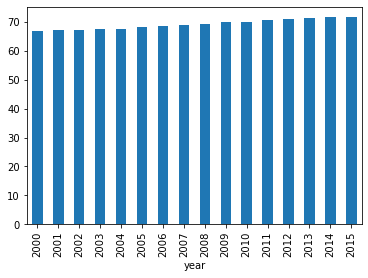

In [148]:
df.groupby('year')['life_expectancy'].mean().plot(kind='bar')
# we can see here that life expectancy is increasing globally

<AxesSubplot:xlabel='year', ylabel='life_expectancy'>

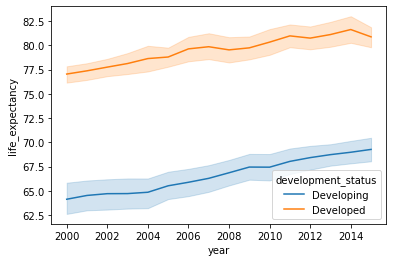

In [58]:
sns.lineplot(data=df, x='year', y='life_expectancy', hue='development_status')
# life expectancy is increasing in both developed and developing countries but there gap is not closing between those two statuses
# life expectancy is decreasing slightly in developed countries in the most recent year of the dataset

<AxesSubplot:xlabel='country'>

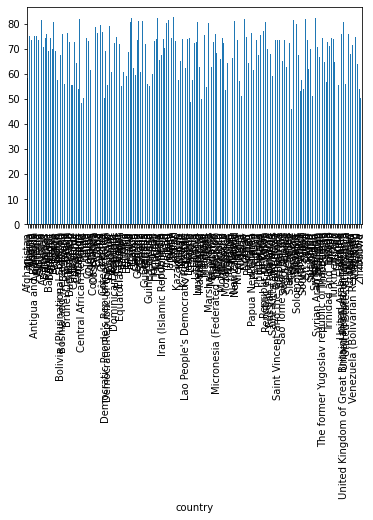

In [60]:
df.groupby('country')['life_expectancy'].mean().plot(kind='bar')
# grouped by country and calculated the mean life expectancy to show the wide varience between countries

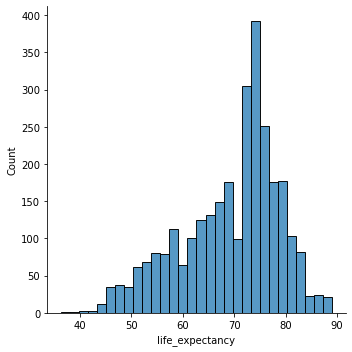

In [61]:
sns.displot(data = df, x= 'life_expectancy')
# this graph shows the distribution of life expectancy around the globe and emphasizes the alarming low numbers in some countries

In [62]:
df.groupby('development_status')['life_expectancy'].mean()
# mean life expectancy is much lower in developing countries

development_status
Developed     79.499155
Developing    66.621190
Name: life_expectancy, dtype: float64

<AxesSubplot:xlabel='development_status'>

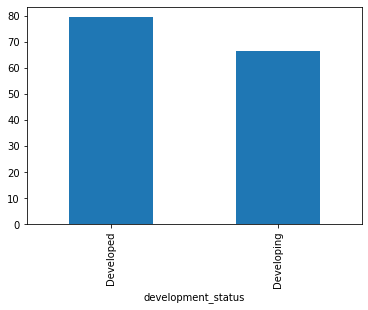

In [63]:
df.groupby('development_status')['life_expectancy'].mean().plot(kind='bar')
# a visual representation of the difference in mean life expectancy in developed and developing countries

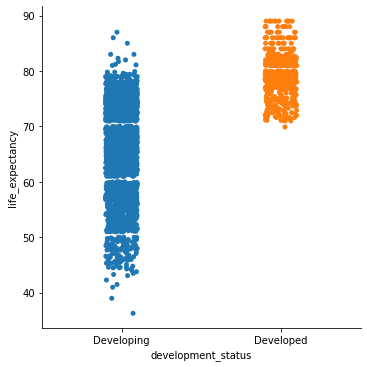

In [199]:
sns.catplot(x="development_status", y="life_expectancy", data=df)
# distribution of life_expectancy is much lower and more spread out for developing countries

sns.pairplot(df)  

I ran this code once, to have some quick and easy visuals of the data to go over, and then saved the image to refer to throughout the analysis process.  

I was able to spot possible correlations to look further into.

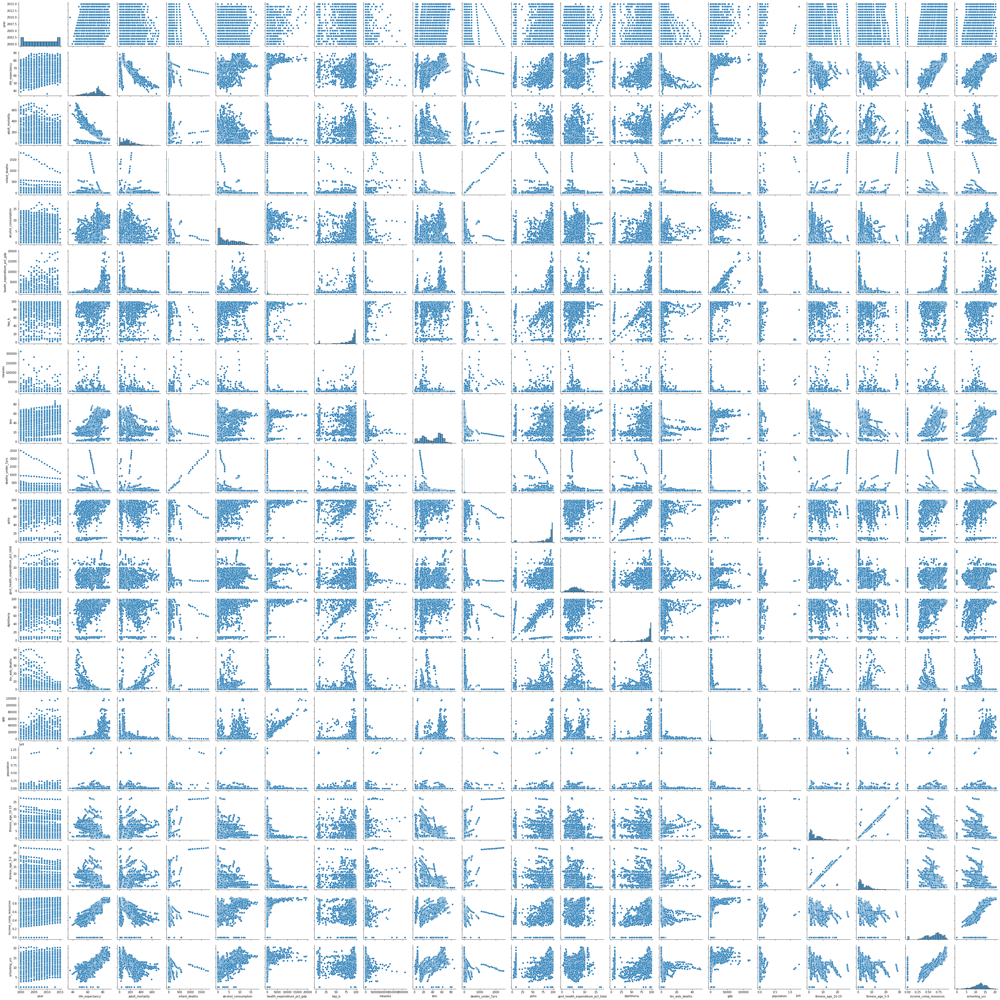

### Overall EDA

<AxesSubplot:xlabel='adult_mortality', ylabel='life_expectancy'>

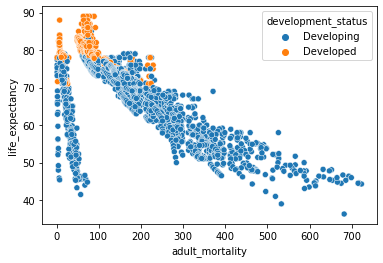

In [65]:
sns.scatterplot(data=df, x='adult_mortality', y='life_expectancy', hue='development_status')
# adult mortality is much higher in developing countries

<AxesSubplot:xlabel='adult_mortality', ylabel='life_expectancy'>

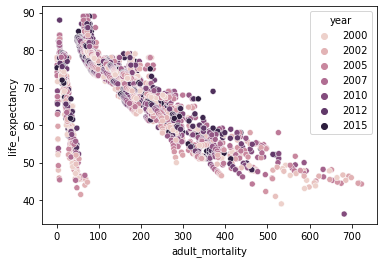

In [66]:
sns.scatterplot(data=df, x='adult_mortality', y='life_expectancy', hue='year')
# shows a lot of variance throughout the years

<AxesSubplot:xlabel='infant_deaths', ylabel='life_expectancy'>

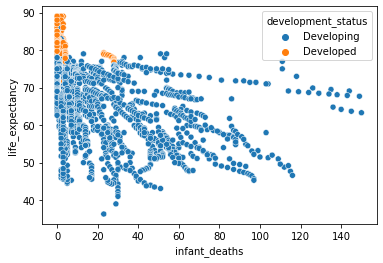

In [67]:
sns.scatterplot(data=df, x='infant_deaths', y='life_expectancy', hue='development_status')
# infant deaths are much more prevalent in developing countries

<AxesSubplot:xlabel='deaths_under_5yrs', ylabel='life_expectancy'>

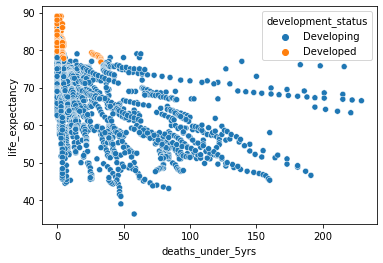

In [68]:
sns.scatterplot(data=df, x='deaths_under_5yrs', y='life_expectancy', hue='development_status')
# deaths of children under the age of 5 are much more prevalent in developing countries

<AxesSubplot:xlabel='year', ylabel='deaths_under_5yrs'>

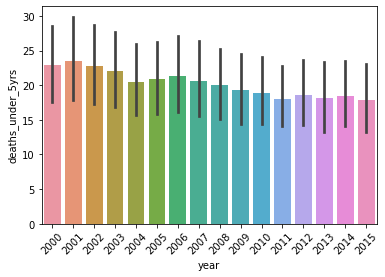

In [150]:
plt.xticks(rotation = 45)
sns.barplot(data=df, x='year', y='deaths_under_5yrs')
# deaths of children under the age of five are decreasing over the years

<AxesSubplot:xlabel='alcohol_consumption', ylabel='life_expectancy'>

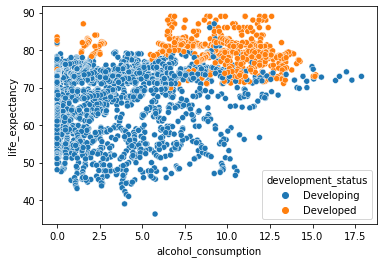

In [70]:
sns.scatterplot(data=df, x='alcohol_consumption', y='life_expectancy', hue='development_status')
# there could be some correlation between alcohol comsumption and life expectancy
# alcohol consumption seems to be generally higher in developed countries

<Figure size 1080x576 with 0 Axes>

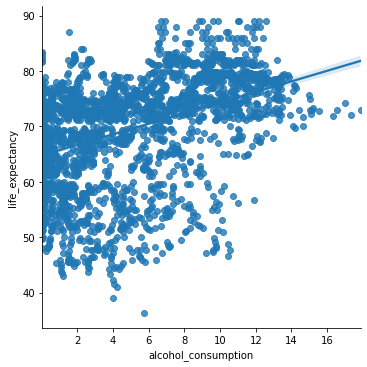

In [159]:
plt.figure(figsize=(15,8))
sns.lmplot(data=df, x='alcohol_consumption', y='life_expectancy')
# is alcohol comsumption positively correlated with life expectancy?
# if so, is this an indication of improved health, or is it related to the citizens in developed countries consuming more
# alcohol than those in developing countries?

<AxesSubplot:xlabel='hep_b_immunization', ylabel='life_expectancy'>

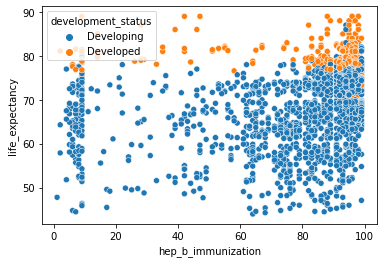

In [72]:
sns.scatterplot(data=df, x='hep_b_immunization', y='life_expectancy', hue='development_status')
# widely spread and doesn't indicate correlation

<AxesSubplot:xlabel='measles_cases', ylabel='life_expectancy'>

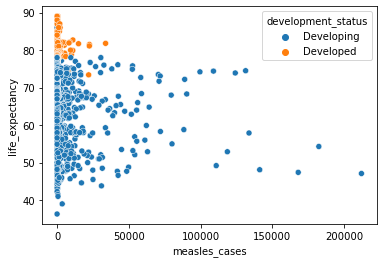

In [73]:
sns.scatterplot(data=df, x='measles_cases', y='life_expectancy', hue='development_status')
# cases are generally low worldwide and do not indicate correlation

<AxesSubplot:xlabel='polio_immunization', ylabel='life_expectancy'>

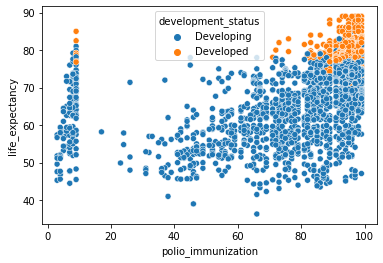

In [75]:
sns.scatterplot(data=df, x='polio_immunization', y='life_expectancy', hue='development_status')
# there may be correlation here since most of the graph indicates higher life expectancy with higher immunization

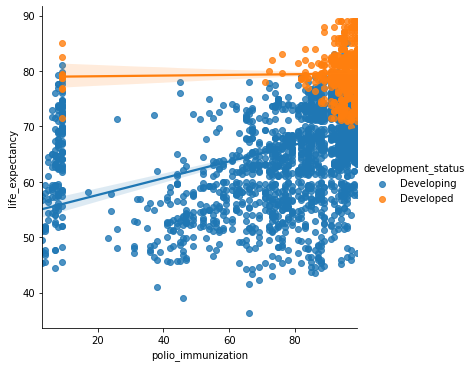

In [76]:
sns.lmplot(data=df, x='polio_immunization', y='life_expectancy', hue='development_status')
# trend lines indicate that the effect of polio immunization seems to be greater in developing countries

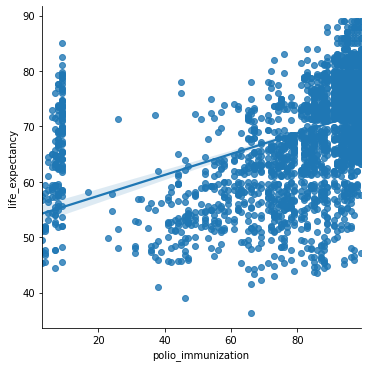

In [77]:
sns.lmplot(data=df, x='polio_immunization', y='life_expectancy')
# and even when all countries are grouped together, there is an upward trend

<AxesSubplot:xlabel='dpt_immunization', ylabel='life_expectancy'>

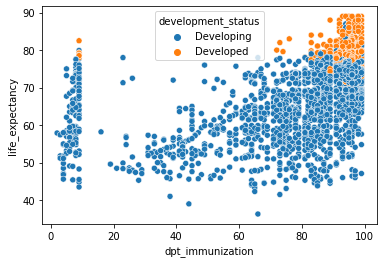

In [78]:
sns.scatterplot(data=df, x='dpt_immunization', y='life_expectancy', hue='development_status')
# indicates that there may be correlation between dpt immunization and life expectancy in developing countries especially

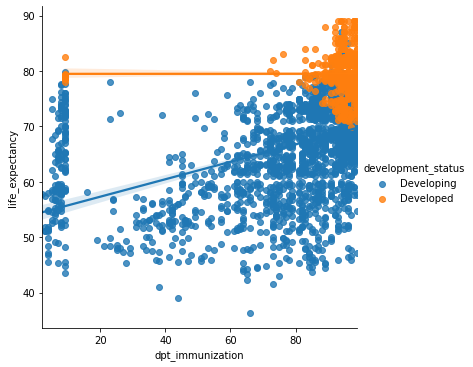

In [79]:
sns.lmplot(data=df, x='dpt_immunization', y='life_expectancy', hue='development_status')
# looks similar to polio immunization trends with immunization possibly acting positively on life expectancy

<AxesSubplot:xlabel='hiv_aids_deaths', ylabel='life_expectancy'>

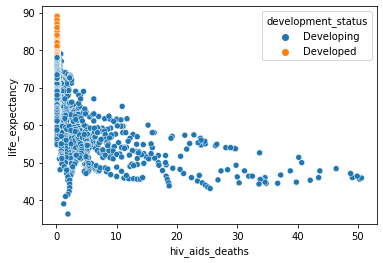

In [80]:
sns.scatterplot(data=df, x='hiv_aids_deaths', y='life_expectancy', hue='development_status')
# HIV/AIDS deaths in young children look rare in the developed countries and likely would not affect life expectancy rates

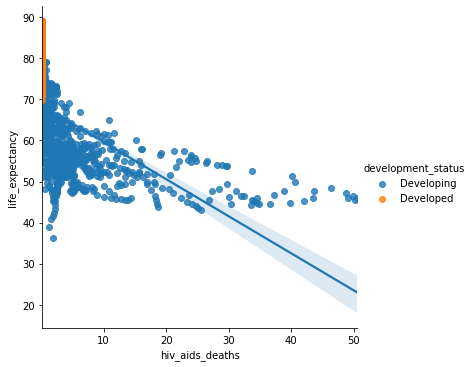

In [81]:
sns.lmplot(data=df, x='hiv_aids_deaths', y='life_expectancy', hue='development_status')
# it appears that higher HIV/AIDS deaths in young children correlates with lower life expectancy

<AxesSubplot:xlabel='year', ylabel='hiv_aids_deaths'>

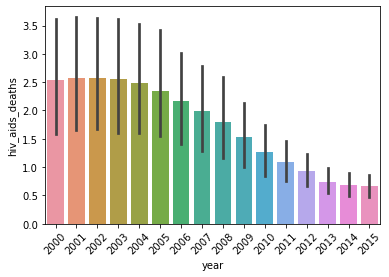

In [151]:
plt.xticks(rotation = 45)
sns.barplot(data=df, x='year', y='hiv_aids_deaths')
# HIV/AIDS deaths in young children are decreasing over time

<AxesSubplot:xlabel='thiness_age_5-9', ylabel='life_expectancy'>

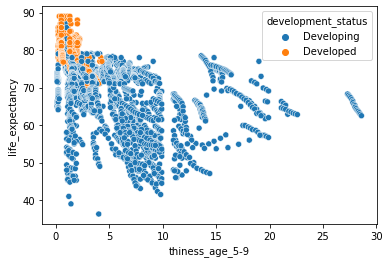

In [83]:
sns.scatterplot(data=df, x='thiness_age_5-9', y='life_expectancy', hue='development_status')
# there doesn't look like there is much correlation likely here

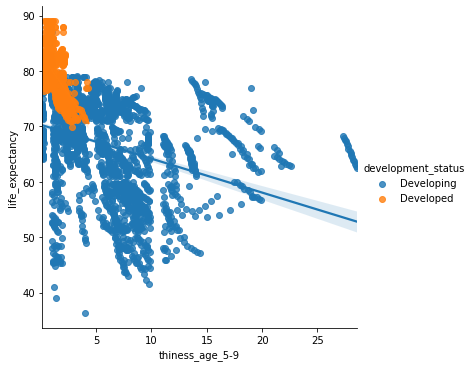

In [84]:
sns.lmplot(data=df, x='thiness_age_5-9', y='life_expectancy', hue='development_status')
# there is a slight trend indicating a relationship between increased thinness and lower life expectancy

<AxesSubplot:xlabel='thiness_age_10-19', ylabel='life_expectancy'>

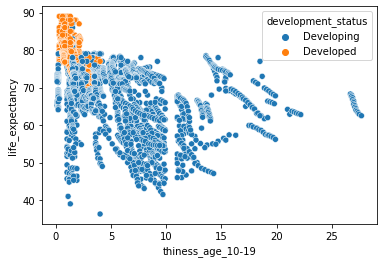

In [85]:
sns.scatterplot(data=df, x='thiness_age_10-19', y='life_expectancy', hue='development_status')
# very similar to the previous thinness variable

<AxesSubplot:xlabel='health_expenditure_pct_gdp', ylabel='life_expectancy'>

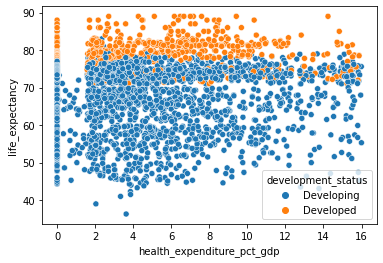

In [86]:
sns.scatterplot(data=df, x='health_expenditure_pct_gdp', y='life_expectancy', hue='development_status')
# looks evenly distributed
# this could confirm the issues I saw in the data cleaning process

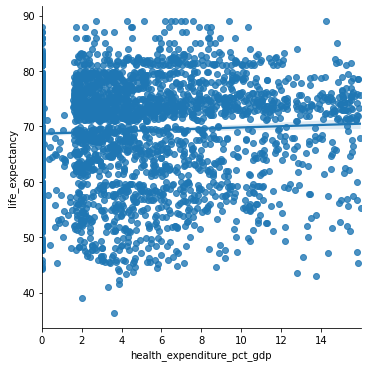

In [87]:
sns.lmplot(data=df, x='health_expenditure_pct_gdp', y='life_expectancy')
# trend line has almost no slope

<AxesSubplot:xlabel='govt_health_expenditure_pct_total', ylabel='life_expectancy'>

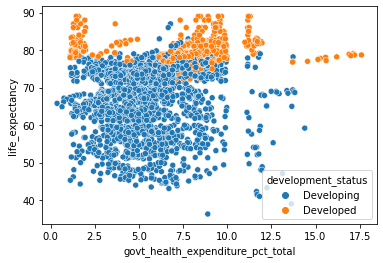

In [88]:
sns.scatterplot(data=df, x='govt_health_expenditure_pct_total', y='life_expectancy', hue='development_status')
# again, pretty evenly distributed with no obvious trend other then the higher life expectancy in developed countries

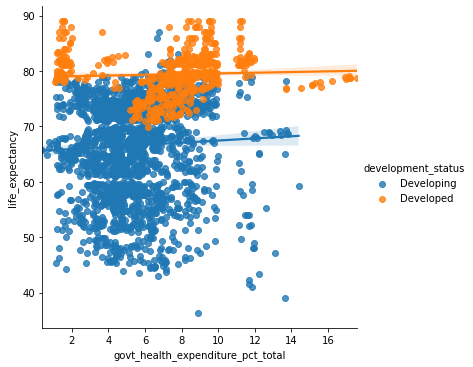

In [89]:
sns.lmplot(data=df, x='govt_health_expenditure_pct_total', y='life_expectancy', hue='development_status')
# and again, not much slope in the trendlines

<AxesSubplot:xlabel='gdp_per_capita', ylabel='life_expectancy'>

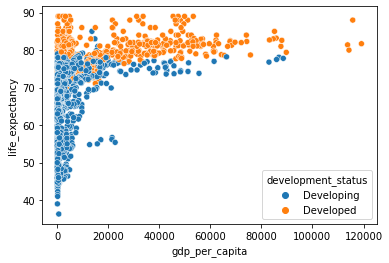

In [91]:
sns.scatterplot(data=df, x='gdp_per_capita', y='life_expectancy', hue='development_status')\
# there looks like there could be positive correlation between gdp per capita and life expectancy

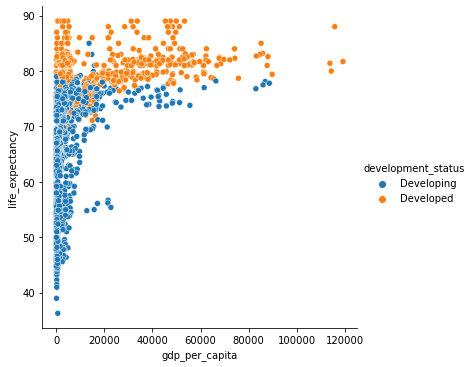

In [92]:
sns.relplot(data=df, x="gdp_per_capita", y="life_expectancy", hue="development_status")
# tried a relational plot to confirm that they give the same results

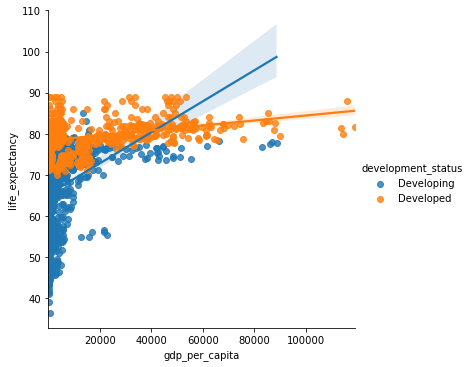

In [94]:
sns.lmplot(data=df, x='gdp_per_capita', y='life_expectancy', hue='development_status')
# it looks like gdp per capita will especially affect life expectancy in developing countries

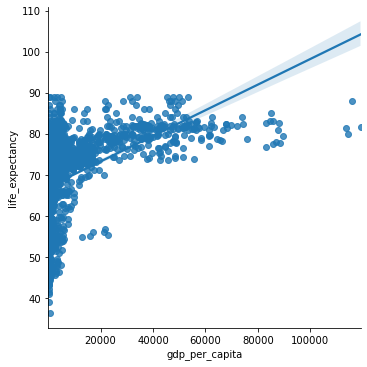

In [95]:
sns.lmplot(data=df, x='gdp_per_capita', y='life_expectancy')
# gdp per capita may also correlate overall

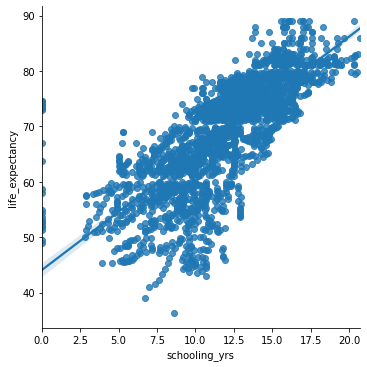

In [96]:
sns.lmplot(data=df, x='schooling_yrs', y='life_expectancy')
# this looks like amount of education will be quite possibly correlated with life expectancy

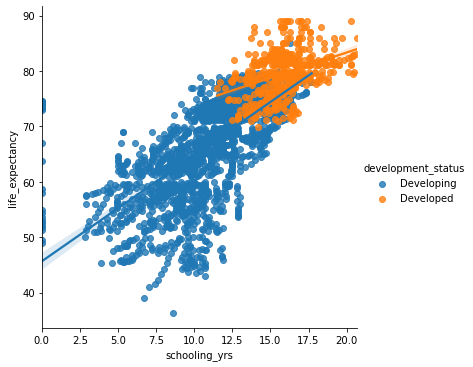

In [97]:
sns.lmplot(data=df, x='schooling_yrs', y='life_expectancy', hue='development_status')
# and the trend seems to be very similar in both developed and developing countries

### EDA on deaths under 5 yrs in relation to immunization  
Side exploration of the rate of deaths in young children to see if there are any noticeable trends to investigate in further steps

In [101]:
df[['polio_immunization', 'dpt_immunization', 'hiv_aids_deaths', 'deaths_under_5yrs']].corr()
# dpt immunization might correlate

,polio_immunization,dpt_immunization,hiv_aids_deaths,deaths_under_5yrs
polio_immunization,1.000000,0.673553,-0.159560,-0.321548
dpt_immunization,0.673553,1.000000,-0.164860,-0.294473
hiv_aids_deaths,-0.159560,-0.164860,1.000000,0.206796
deaths_under_5yrs,-0.321548,-0.294473,0.206796,1.000000


<AxesSubplot:xlabel='polio_immunization', ylabel='deaths_under_5yrs'>

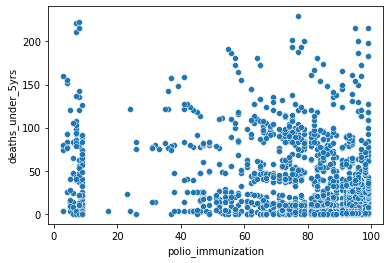

In [102]:
sns.scatterplot(data=df, x='polio_immunization', y='deaths_under_5yrs')
# the dats is very spread out so there may not be much correlation

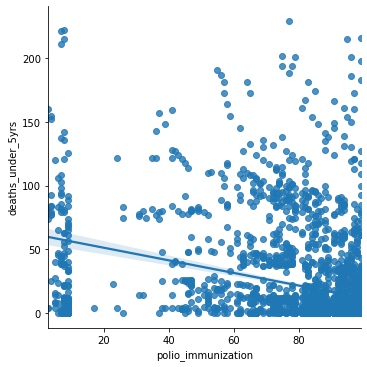

In [103]:
sns.lmplot(data=df, x='polio_immunization', y='deaths_under_5yrs')
# data is scattered but when forced into a trendline, increased immunization might correlate with decreased death in young children

<AxesSubplot:xlabel='dpt_immunization', ylabel='deaths_under_5yrs'>

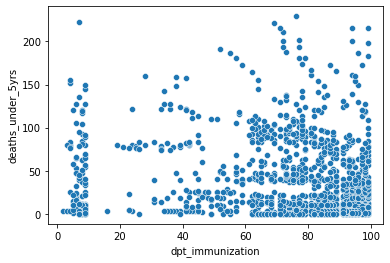

In [104]:
sns.scatterplot(data=df, x='dpt_immunization', y='deaths_under_5yrs')
# very similar results to polio immunization

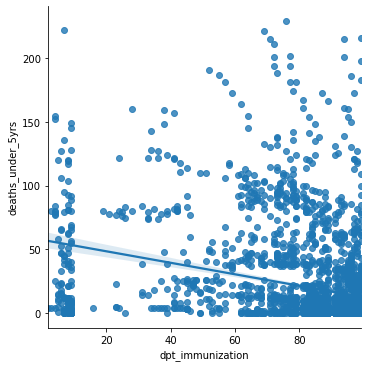

In [105]:
sns.lmplot(data=df, x='dpt_immunization', y='deaths_under_5yrs')
# and a similar trendline

## World Regression Analysis  
Regression analysis to determine the best predictors of life expectancey worldwide.

In [113]:
# creating a new dataframe to work with in regression analysis
# independent variables chosen based on exploratory data analysis
# some variables that looked weaker in correlation kept just to make sure
regression_data = df[['life_expectancy', 'adult_mortality', 'infant_deaths', 'health_expenditure_pct_gdp', 'alcohol_consumption', 'deaths_under_5yrs', 'polio_immunization', 'govt_health_expenditure_pct_total', 'dpt_immunization', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita', 'Developed', 'Developing']]

In [114]:
# dropping NaN values so that the 
regression_data = regression_data.dropna()

In [111]:
# double checking to make sure that all relevant value datatypes are numerical
regression_data.dtypes

life_expectancy                      float64
adult_mortality                      float64
infant_deaths                        float64
health_expenditure_pct_gdp           float64
alcohol_consumption                  float64
deaths_under_5yrs                    float64
polio_immunization                   float64
govt_health_expenditure_pct_total    float64
dpt_immunization                     float64
thiness_age_5-9                      float64
schooling_yrs                        float64
gdp_per_capita                       float64
Developed                              uint8
Developing                             uint8
development_status_int               float32
dtype: object

In [115]:
# first round of regression analysis
dependent_variables = regression_data['life_expectancy'] # declaring the dependent and independent variables
independent_variables = regression_data[['adult_mortality', 'infant_deaths', 'health_expenditure_pct_gdp', 'alcohol_consumption', 'deaths_under_5yrs', 'polio_immunization', 'govt_health_expenditure_pct_total', 'dpt_immunization', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita', 'Developed', 'Developing']]
independent_variables['constant'] = 1  # adding a constant variable for analysis so that linear relations won't be forced through the origin of the axes 

# using the OLS (ordinary least squares) method to estimate the unknown parameters for the linear regression model and 
# returning the objects to be fit for regression lines
lin_regression = sm.OLS(dependent_variables, independent_variables)
regression_results = lin_regression.fit()  # calling on the fit method to estimate the best regression model for the OLS object (and hence the variables)
print(regression_results.summary())  # printing a readable summary of the regression analysis

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.791
Method:                 Least Squares   F-statistic:                     700.7
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        20:35:10   Log-Likelihood:                -6428.7
No. Observations:                2213   AIC:                         1.288e+04
Df Residuals:                    2200   BIC:                         1.296e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
adult_

In [121]:
# from the above results, health_expenditure_pct_gdp and govt_health_expenditure_pct_total should be removed from the regression analysis
# based on high p values
# run second regression with these changes

independent_variables2 = independent_variables[['adult_mortality', 'infant_deaths', 'deaths_under_5yrs', 'polio_immunization', 'dpt_immunization', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita', 'constant', 'Developed', 'Developing']]

lin_regression2 = sm.OLS(dependent_variables, independent_variables2)
regression_results2 = lin_regression2.fit()
print(regression_results2.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     922.6
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        20:49:26   Log-Likelihood:                -6440.9
No. Observations:                2213   AIC:                         1.290e+04
Df Residuals:                    2203   BIC:                         1.296e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
adult_mortality       -0.0273      0

In [155]:
# from second regression: polio immunization - still under 0.05 but try without
# low coefficients may be just due to the range in value sizes and their units
# I ran this several times with changes based on the note re multicollinearity, for example Developed and Developing, infant deaths and deaths under 5 years
# the extremely low coef of gdp_per_capita indicated that it's close to zero and unlikely having much effect

independent_variables3 = independent_variables[['adult_mortality', 'infant_deaths', 'deaths_under_5yrs', 'dpt_immunization', 'schooling_yrs', 'constant', 'Developing']]

lin_regression3 = sm.OLS(dependent_variables, independent_variables3)
regression_results3 = lin_regression3.fit()
print(regression_results3.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.781
Method:                 Least Squares   F-statistic:                     1320.
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        23:12:46   Log-Likelihood:                -6483.5
No. Observations:                2213   AIC:                         1.298e+04
Df Residuals:                    2206   BIC:                         1.302e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
adult_mortality      -0.0286      0.00

I was unable to get rid of the multicollinearity issue, so possibly it was other numerical problems.

In all models, R-squared and adjust R-squared were very close indicating that using multiple independent variables was fine. In the end, 'adult_mortality', 'infant_deaths', 'deaths_under_5yrs', 'dpt_immunization', 'schooling_yrs', 'Developing' seemed to the independent variables providing the best model for predicting life expectancy.

Because of the results I noticed during EDA, I decided to look at developed and developing countries separately to see if the predicting variables would be very different.

## Separate Regression Analysis of Developed and Developing Countries

The coding and steps involved were commented and explained in World Regression Analysis section above.

In [122]:
# dviding the dataframe into two dataframes based on development status of countries
developed_countries = df[df['development_status'] == 'Developed']
developing_countries = df[df['development_status'] == 'Developing']

A quick look at the summary statistics and possible correlations in each dataframe and saving the datasets for possible further work:

In [123]:
len(developed_countries)

592

In [124]:
round(developed_countries.describe(),2)

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
count,592.00,592.00,592.00,592.00,559.00,592.00,400.00,592.00,592.00,592.00,...,592.0,528.00,496.00,592.00,592.00,544.00,544.00,592.0,592.0,592.0
mean,2007.50,79.50,78.10,1.46,9.62,5.25,85.06,511.51,1.75,93.68,...,0.1,22240.20,7148332.71,1.25,1.22,0.86,15.89,1.0,1.0,0.0
std,4.61,3.86,45.74,4.29,2.89,4.11,23.80,2482.37,5.03,11.26,...,0.0,21998.25,15303304.14,0.73,0.80,0.05,1.66,0.0,0.0,0.0
min,2000.00,69.90,1.00,0.00,0.01,0.00,2.00,0.00,0.00,9.00,...,0.1,12.28,123.00,0.30,0.20,0.70,11.50,1.0,1.0,0.0
25%,2003.75,77.30,59.00,0.00,8.30,2.08,88.00,1.00,0.00,93.00,...,0.1,4116.04,134071.25,0.70,0.60,0.82,14.90,1.0,1.0,0.0
50%,2007.50,79.50,74.00,0.00,10.15,4.52,95.00,12.50,0.00,96.00,...,0.1,14349.79,1163157.00,1.00,0.90,0.87,15.80,1.0,1.0,0.0
75%,2011.25,81.82,92.00,2.00,11.58,7.81,97.00,101.50,2.00,98.00,...,0.1,36467.60,5881714.50,1.80,1.80,0.89,16.80,1.0,1.0,0.0
max,2015.00,89.00,229.00,28.00,15.19,15.87,99.00,33812.00,33.00,99.00,...,0.1,119172.74,82534176.00,4.00,4.30,0.95,20.70,1.0,1.0,0.0


In [125]:
developed_countries.corr().head(2)

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
year,1.000000,0.346128,-0.123414,-0.041162,-0.112584,-0.050432,0.142378,-0.083580,-0.040573,0.107968,...,NaN,0.125630,0.006043,-0.076602,-0.080784,0.393719,0.255175,NaN,NaN,NaN
life_expectancy,0.346128,1.000000,-0.452310,-0.052518,-0.278094,0.015171,-0.153120,0.031906,-0.049005,0.017575,...,NaN,0.341721,0.092912,-0.587749,-0.595431,0.712198,0.384210,NaN,NaN,NaN


In [126]:
len(developing_countries)

2346

In [127]:
round(developing_countries.describe(),2)

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
count,2346.00,2336.00,2336.00,2238.00,2185.00,2346.00,1985.00,2346.00,2249.00,2327.00,...,2346.00,1962.00,1.790000e+03,2312.00,2312.00,2227.00,2231.00,2346.0,2346.0,2346.0
mean,2007.52,66.62,186.77,17.00,3.32,4.58,80.11,2901.09,25.07,79.72,...,2.16,3511.84,1.430650e+07,5.76,5.80,0.57,11.04,0.0,0.0,1.0
std,4.61,8.74,128.25,24.76,3.23,4.11,25.24,12727.58,38.35,24.84,...,5.61,7348.71,6.840036e+07,4.50,4.59,0.20,2.96,0.0,0.0,0.0
min,2000.00,36.30,1.00,0.00,0.01,0.00,1.00,0.00,0.00,3.00,...,0.10,1.68,3.400000e+01,0.10,0.10,0.00,0.00,0.0,0.0,1.0
25%,2004.00,59.90,99.00,1.00,0.49,1.71,75.00,0.00,1.00,74.00,...,0.10,373.57,2.166105e+05,2.20,2.30,0.46,9.40,0.0,0.0,1.0
50%,2008.00,68.60,166.50,5.00,2.41,3.66,91.00,18.00,7.00,89.00,...,0.10,1174.81,1.412966e+06,4.90,4.90,0.62,11.60,0.0,0.0,1.0
75%,2012.00,73.70,258.00,25.00,5.39,6.94,97.00,557.50,36.00,97.00,...,1.50,3842.30,7.989986e+06,7.80,7.80,0.72,13.00,0.0,0.0,1.0
max,2015.00,87.00,723.00,150.00,17.87,15.99,99.00,212183.00,229.00,99.00,...,50.60,88564.82,1.293859e+09,27.70,28.60,0.86,17.70,0.0,0.0,1.0


In [128]:
developing_countries.corr().head(2)

,year,life_expectancy,adult_mortality,infant_deaths,alcohol_consumption,health_expenditure_pct_gdp,hep_b_immunization,measles_cases,deaths_under_5yrs,polio_immunization,...,hiv_aids_deaths,gdp_per_capita,population,thiness_age_10-19,thiness_age_5-9,income_comp_resources,schooling_yrs,development_status_int,Developed,Developing
year,1.000000,0.193502,-0.084887,-0.040720,-0.059974,-0.090875,0.100570,-0.089152,-0.057089,0.100314,...,-0.158836,0.150604,0.018995,-0.056711,-0.060048,0.299668,0.261942,NaN,NaN,NaN
life_expectancy,0.193502,1.000000,-0.651330,-0.464923,0.138591,0.015888,0.297972,-0.138437,-0.489329,0.431340,...,-0.578708,0.316212,0.006193,-0.329495,-0.321985,0.613416,0.657966,NaN,NaN,NaN


In [129]:
developed_countries.to_csv('who_life_expectancy_developed_countries.csv', index=False)

In [130]:
developing_countries.to_csv('who_life_expectancy_developing_countries.csv', index=False)

Regression analysis on developed countries:

In [131]:
developed_regression_data = developed_countries[['life_expectancy', 'adult_mortality', 'infant_deaths', 'alcohol_consumption', 'deaths_under_5yrs', 'hiv_aids_deaths', 'schooling_yrs']]

In [132]:
developed_regression_data = developed_regression_data.dropna()

In [138]:
developed_dependent_variables = developed_regression_data['life_expectancy']
developed_independent_variables = developed_regression_data[[ 'adult_mortality', 'infant_deaths', 'alcohol_consumption', 'deaths_under_5yrs', 'schooling_yrs']]
developed_independent_variables['constant'] = 1 

developed_lin_regression = sm.OLS(developed_dependent_variables, developed_independent_variables)
developed_regression_results = developed_lin_regression.fit()
print(developed_regression_results.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.348
Model:                            OLS   Adj. R-squared:                  0.341
Method:                 Least Squares   F-statistic:                     54.03
Date:                Mon, 29 Nov 2021   Prob (F-statistic):           6.03e-45
Time:                        20:52:42   Log-Likelihood:                -1324.6
No. Observations:                 513   AIC:                             2661.
Df Residuals:                     507   BIC:                             2687.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
adult_mortality        -0.0310    

<ipython-input-138-c38ed996bc0d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  developed_independent_variables['constant'] = 1


In [134]:
developed_independent_variables2 = developed_regression_data[['adult_mortality', 'alcohol_consumption', 'schooling_yrs']]
developed_independent_variables2['constant'] = 1 

developed_lin_regression2 = sm.OLS(developed_dependent_variables, developed_independent_variables2)
developed_regression_results2 = developed_lin_regression2.fit()
print(developed_regression_results2.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.340
Model:                            OLS   Adj. R-squared:                  0.336
Method:                 Least Squares   F-statistic:                     87.35
Date:                Mon, 29 Nov 2021   Prob (F-statistic):           1.31e-45
Time:                        20:51:25   Log-Likelihood:                -1327.7
No. Observations:                 513   AIC:                             2663.
Df Residuals:                     509   BIC:                             2680.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
adult_mortality        -0.0308    

<ipython-input-134-7e994168edac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  developed_independent_variables2['constant'] = 1


Regression analysis on developing countries:

In [135]:
developing_regression_data = developing_countries[['life_expectancy', 'adult_mortality', 'infant_deaths', 'health_expenditure_pct_gdp', 'alcohol_consumption', 'deaths_under_5yrs', 'polio_immunization', 'govt_health_expenditure_pct_total', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita']] 

In [136]:
developing_regression_data = developing_regression_data.dropna()

In [139]:
developing_dependent_variables = developing_regression_data['life_expectancy']
developing_independent_variables = developing_regression_data[['adult_mortality', 'infant_deaths', 'alcohol_consumption', 'deaths_under_5yrs', 'polio_immunization', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita']]
developing_independent_variables['constant'] = 1 

developing_lin_regression = sm.OLS(developing_dependent_variables, developing_independent_variables)
developing_regression_results = developing_lin_regression.fit()
print(developing_regression_results.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.798
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     675.4
Date:                Mon, 29 Nov 2021   Prob (F-statistic):               0.00
Time:                        20:52:52   Log-Likelihood:                -4817.5
No. Observations:                1718   AIC:                             9657.
Df Residuals:                    1707   BIC:                             9717.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
adult_mortality        -0.0157    

<ipython-input-139-db4c943123bc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  developing_independent_variables['constant'] = 1


In [157]:
# removed alcohol consumption based on the results of the first regression model
# that resulted in a higher p value for polio immunization so I removed that variable as well

developing_independent_variables2 = developing_regression_data[['adult_mortality', 'infant_deaths', 'deaths_under_5yrs', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs', 'gdp_per_capita']]
developing_independent_variables2['constant'] = 1 

developing_lin_regression2 = sm.OLS(developing_dependent_variables, developing_independent_variables2)
developing_regression_results2 = developing_lin_regression2.fit()
print(developing_regression_results2.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.798
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     841.8
Date:                Tue, 30 Nov 2021   Prob (F-statistic):               0.00
Time:                        00:19:10   Log-Likelihood:                -4820.3
No. Observations:                1718   AIC:                             9659.
Df Residuals:                    1709   BIC:                             9708.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
adult_mortality      -0.0158      0.00

<ipython-input-157-d3d22263edba>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  developing_independent_variables2['constant'] = 1


Checking for possible multicollinearity:

In [142]:
developing_regression_data[['adult_mortality', 'infant_deaths', 'deaths_under_5yrs']].corr()

,adult_mortality,infant_deaths,deaths_under_5yrs
adult_mortality,1.000000,0.264536,0.296665
infant_deaths,0.264536,1.000000,0.985566
deaths_under_5yrs,0.296665,0.985566,1.000000


In [158]:
# removed infant_deaths since it seemed to be highly correlated with deaths under 5 years
# removed gdp per capita since the coef was so low that it would have very little effect on the life_expectancy

# the multicollinearity issue did not disappear so it may be other numerical issues
# R squared and the adjusted R squared are now equal which indicates that number of variables is fine

developing_independent_variables3 = developing_regression_data[['adult_mortality', 'deaths_under_5yrs', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs']]
developing_independent_variables3['constant'] = 1   

developing_lin_regression3 = sm.OLS(developing_dependent_variables, developing_independent_variables3)
developing_regression_results3 = developing_lin_regression3.fit()
print(developing_regression_results3.summary())

                            OLS Regression Results                            
Dep. Variable:        life_expectancy   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.781
Method:                 Least Squares   F-statistic:                     1020.
Date:                Tue, 30 Nov 2021   Prob (F-statistic):               0.00
Time:                        00:24:56   Log-Likelihood:                -4886.2
No. Observations:                1718   AIC:                             9786.
Df Residuals:                    1711   BIC:                             9825.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
adult_mortality      -0.0167      0.00

<ipython-input-158-fd1693616c03>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  developing_independent_variables3['constant'] = 1


In [198]:
# attempted to test the regression model using .predict but couldn't get it to work
# [['adult_mortality', 'deaths_under_5yrs', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs']]
developing_regression_results3.predict([180, 25, 90, 1, 4, 14])

ValueError: shapes (1,6) and (7,) not aligned: 6 (dim 1) != 7 (dim 0)

Results:  

For developed countries, R-squared was very low but even so, the best predicting variables were found to be 'adult_mortality', 'alcohol_consumption', 'schooling_yrs'.   

For developing countries, R-squared was much higher and adjusted R-squared was equal to to R-squared in the last regression model. The best predicting variables were found to be 'adult_mortality',  'deaths_under_5yrs', 'dpt_immunization', 'hiv_aids_deaths', 'thiness_age_5-9', 'schooling_yrs'. 

## Conclusions and Recommendations

Although I was able to do get a strong model for predicting life_expectancy around the world in developed and developing countries all together, the individual models for each development status were more interesting and useful. The model for developing countries was also very strong.  The measures gathered by the World Health Organization were much better predicters of life expectancy in developing countries than developed countries. Therefore, this information can be useful in increasing life expectancy in developing countries were it is much lower and needs to be improved.  

The independent variables that I found to be the best predictors of life expectancy in developing countries were The best predicting variables were found to be adult mortality, deaths under 5 years, dpt immunization, HIV/AIDS deaths, thinness age 5-9, and years of schooling. Infant deaths would not be included in a predictive model since they are collinear with deaths under five years, but they would be included with the other variables as a variable to take action on in real world application.

The figure below shows there has been progress in lowering deaths in children under 5 years in developing countries. According to the results of the regression analysis, this has a positive effect on increasing life_expectancy so this is an area that nations and NGOs can keep focusing on. Further exploration can be done on the causes of death in children under 5 in order to more effectively lower these numbers. 

<AxesSubplot:xlabel='year', ylabel='deaths_under_5yrs'>

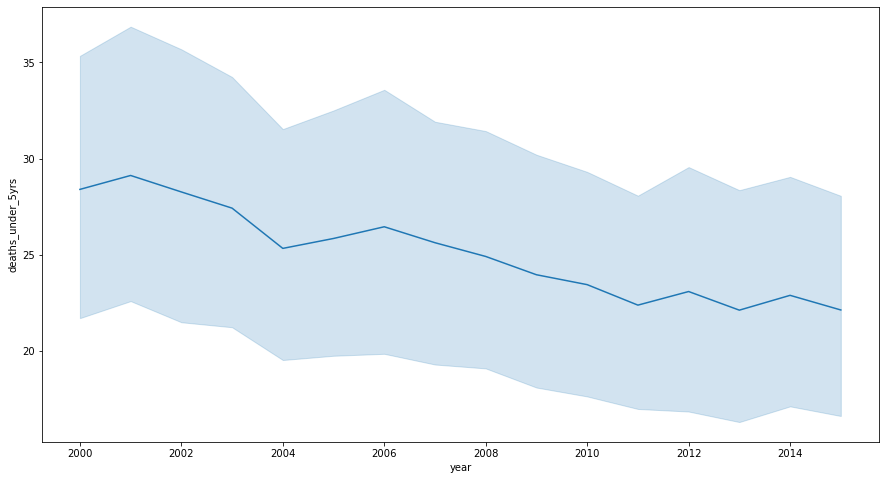

In [169]:
plt.figure(figsize=(15,8))
sns.lineplot(data=developing_countries, x='year', y='deaths_under_5yrs')

This figure uses colour for each year to further illustrate that life expectancy is increasing as deaths under 5 decrease over the years. The decrease in slope steepness in the trend lines as the years increase show that deaths under 5 are gradually becoming less of a factor in life expectancy since the numbers of deaths are decreasing.

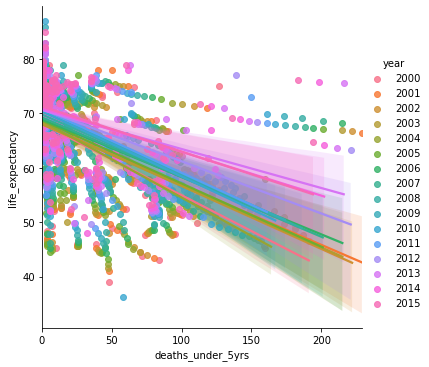

In [177]:
sns.lmplot(data=developing_countries, x='deaths_under_5yrs', y='life_expectancy', hue='year')

This graph clearly shows how much HIV/AIDS deaths in infants and young children has been decreasing. Governments and NGOs can continue to lower these numbers with interventions they've been using since they seem to be effective.

<AxesSubplot:xlabel='year', ylabel='hiv_aids_deaths'>

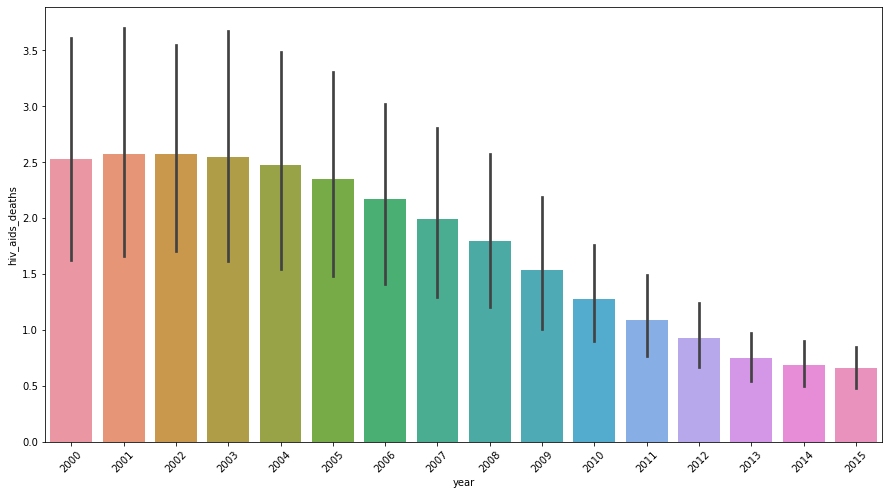

In [184]:
plt.figure(figsize=(15,8))
plt.xticks(rotation = 45)
sns.barplot(data=df, x='year', y='hiv_aids_deaths')

As seen in the figure below, thinness in children has been decreasing over the years but still has room for more progress. Perhaps the causes of thinness can be further studied in order to seek more effective solutions.

<AxesSubplot:xlabel='year', ylabel='thiness_age_5-9'>

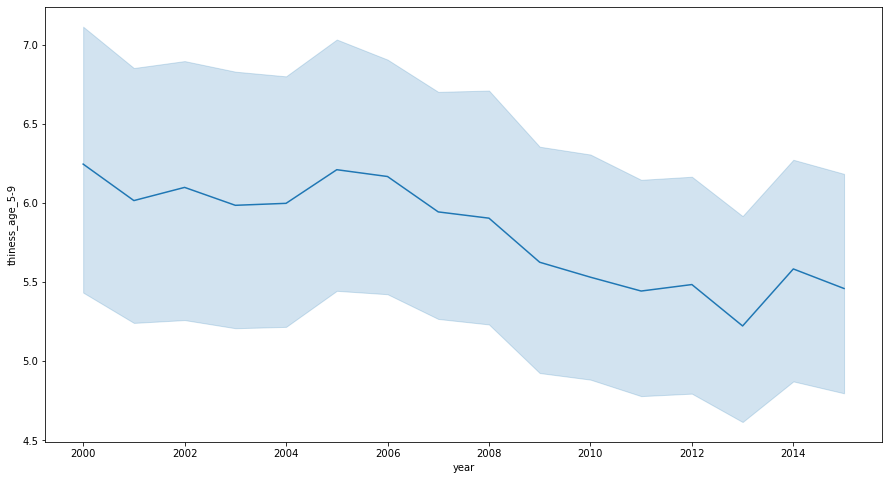

In [182]:
plt.figure(figsize=(15,8))
sns.lineplot(data=developing_countries, x='year', y='thiness_age_5-9')

In the figure below, there are huge variances in adult mortality around the world. Countries should continue to work on reducing these numbers but each of the lower ones especially will like require more in depth research into the leading causes of adult mortality. Some of these maybe due to conflict and war, and unsafe working conditions, but likely high rates of adult mortality could often be related to health issues and lack of access to affordable health care.

<AxesSubplot:xlabel='country'>

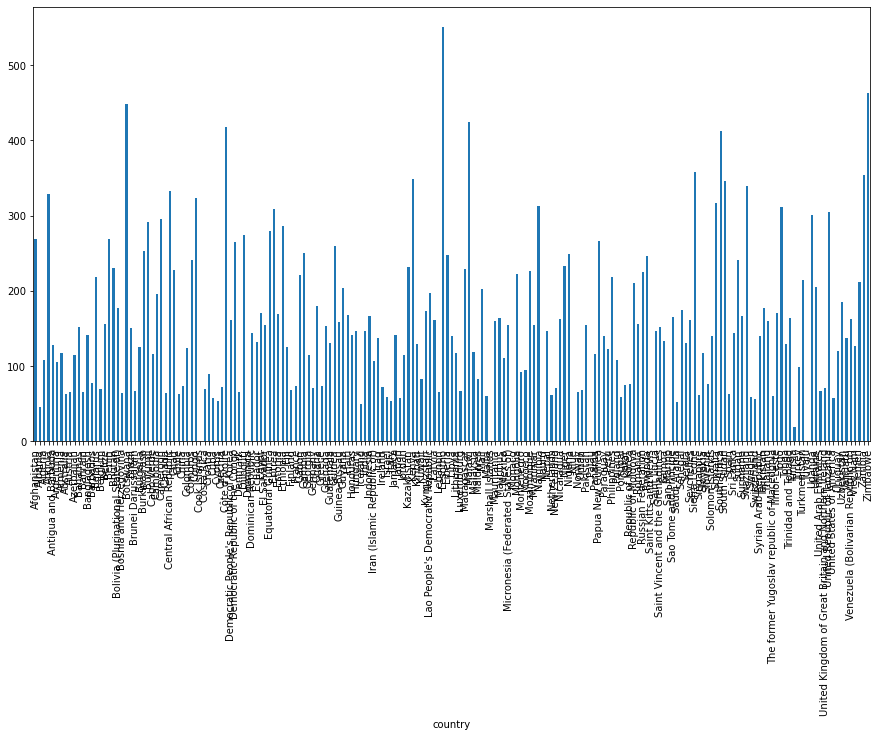

In [194]:
plt.figure(figsize=(15,8))
df.groupby('country')['adult_mortality'].mean().plot(kind='bar')

This last figure shows the strong correlation between years of schooling and higher life expectancy. The slopes of the trendlines show that the correlation hasn't changed much over the years covered in this dataset but that does not mean that it is not an important factor to focus on. The positive slope close to a 45 degree angle indicates how strong of correlation education has in increasing life expectancy and all stakeholders should continue to focus resources on making sure that all citizens receive as much schooling as possible.

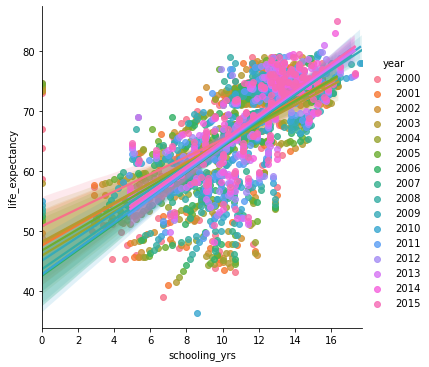

In [181]:
sns.lmplot(data=developing_countries, x='schooling_yrs', y='life_expectancy', hue='year')

## Further Steps

Re nulls and NaNs, I could try using median values as substitutes.

I found out afterwards that the metadata provided may have been incorrectly defined (for example infant deaths) so I could use that data in a different way and re-analyze it.

I could look for data representing other possible factors affecting life expectancy in developed and developing countries.

Side exploration into death rates of young children indicated that this data could be further analyzed in relation to deaths under 5 years. Likely, further exploration and analysis could be done similarily on infant deaths, thinness, and adult mortality as well. 

## Reference Websites

Data source: https://www.kaggle.com/kumarajarshi/life-expectancy-who

Websites referenced during research:

https://en.wikipedia.org/wiki/List_of_countries_by_body_mass_index

https://worldpopulationreview.com/country-rankings/obesity-rates-by-country 

https://www.who.int/data/gho/data/themes/topics/indicator-groups/indicator-group-details/GHO/infant-mortality

https://www.who.int/phe/health_topics/outdoorair/databases/country_grouping_2016.pdf

https://icqi.org/developing-countries-list/

https://data.worldbank.org/indicator/SP.DYN.IMRT.IN?most_recent_year_desc=true&view=map&year=2000

https://data.worldbank.org/indicator/SH.DYN.MORT?view=map&year=2000 

https://data.worldbank.org/indicator/SH.XPD.CHEX.GD.ZS?view=map&year=2000

http://hdr.undp.org/en/content/human-development-index-hdi
